# __Image Processing and Analysis - 1st Set of Exercises__
__Name:__ Konstantinos Giatras

__Student ID:__ 7115152300005

__Professor:__ Vassilis Katsouros

__Academic Year:__ 2023-2024

MSc Data Science & Information Technologies, Bioinformatics - Biomedical Data Science Specialization

***

# <ins>Exercise 1</ins>

## _a) Explain the impact of the following transformation function on a grayscale image, in terms of intensity values and brightness._
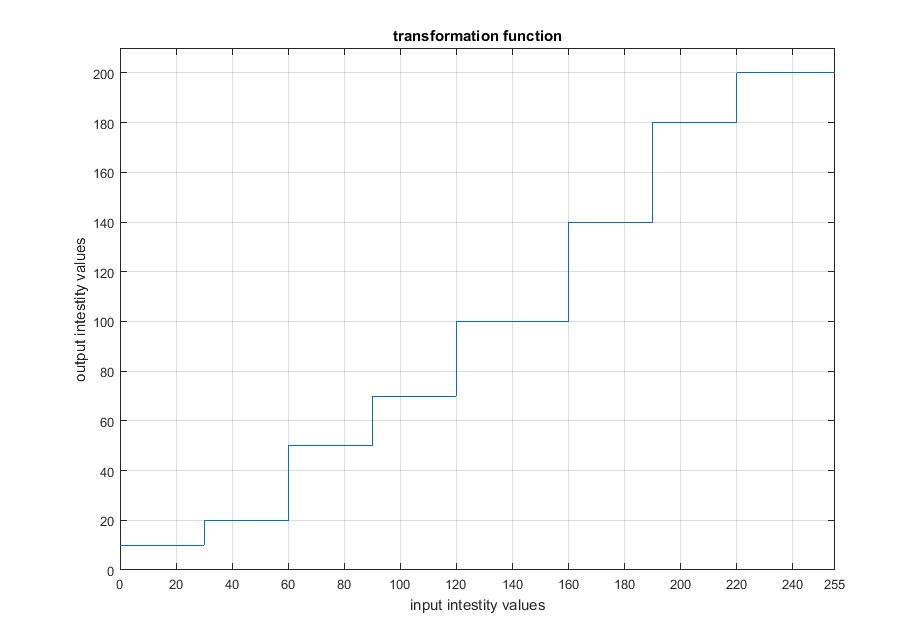

The above plot represents a step transformation function, which maps input intensity values of a grayscale image to new output intensity values. The x-axis represents the input intensity values (ranging from 0 to 255), and the y-axis represents the output intensity values after applying the transformation. The step function is not continuous but has discrete steps. Specific ranges of input intensity values are mapped to particular output intensity values:

* Input: 0 - 30 , Output: 10 
* Input: 31 - 60 , Output: 20
* Input: 61 - 90 , Output: 50
* Input: 91 - 120 , Output: 70
* Input: 121 - 160 , Output: 100
* Input: 161 - 190 , Output: 140
* Input: 191 - 220 , Output: 180
* Input: 221 - 255 , Output: 200

This step transformation function quantizes the grayscale image from 256 intensity levels to just 8 (8-bit to 3-bit), resulting in significant loss of detail and the creation of distinct bands of uniform intensity. This leads to a posterization effect where smooth transitions are replaced by abrupt changes, giving the image a cartoon-like appearance. The granularity of intensity variations is significantly reduced, causing subtle differences in the original image to be lost.

Additionally, the overall brightness of the image decreases because the output intensity levels are generally lower than the input levels, making the image appear darker. The contrast between adjacent regions increases, making boundaries more pronounced but at the expense of smooth gradients, which are replaced by sharp edges.

## _b) Verify your answer by a applying the transformation on an image of your choice (include input/output images in your answer)._

Below is an implementation of the step transformation function on a chosen grayscale image:

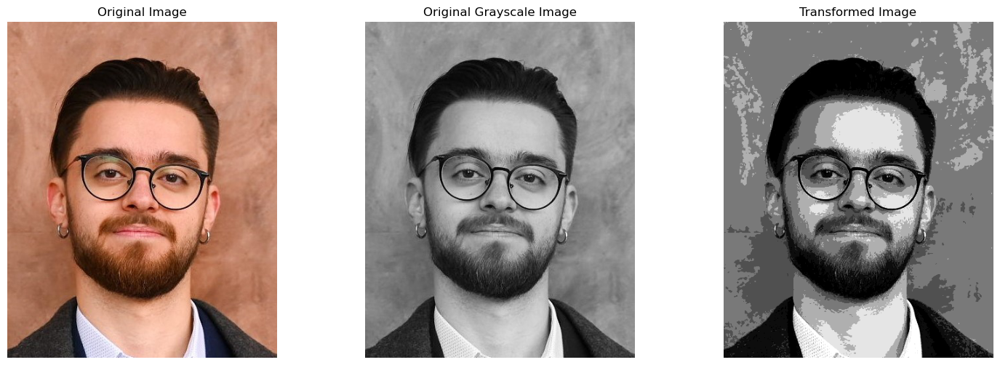

In [3]:
# Importing the necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.color import rgb2gray

# Loading the chosen image
image = Image.open("Photo - Konstantinos_Giatras.jpg")
image_gray = rgb2gray(image) # Converting the image to grayscale
image_gray = (image_gray * 255).astype(np.uint8) # Converting the image to 8-bit

# Defining the step transformation function with the appropriate steps
def step_transform(value):
    if 0 <= value <= 30:
        return 10
    elif 31 <= value <= 60:
        return 20
    elif 61 <= value <= 90:
        return 50
    elif 91 <= value <= 120:
        return 70
    elif 121 <= value <= 160:
        return 100
    elif 161 <= value <= 190:
        return 140
    elif 191 <= value <= 220:
        return 180
    elif 221 <= value <= 255:
        return 200
    else:
        return value

# Initialize an empty array for the transformed image
transformed_image = np.zeros_like(image_gray)

# Applying the step transformation using a loop
for i in range(image_gray.shape[0]):
    for j in range(image_gray.shape[1]):
        transformed_image[i, j] = step_transform(image_gray[i, j])

# Displaying the original and transformed images
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis('off')

axes[1].imshow(image_gray, cmap='gray')
axes[1].set_title("Original Grayscale Image")
axes[1].axis('off')

axes[2].imshow(transformed_image, cmap='gray')
axes[2].set_title("Transformed Image")
axes[2].axis('off')

plt.show()


These results verify our earlier claims, since we indeed observe a posterization of the original image, the appearance of sharper edges and the overall darker colors of the transformed image.

***

# <ins>Exercise 2</ins>

## _Propose a method for enhancing the image “__nature_dark_forest.jpg__” in terms of the perceived light and color._

To enhance the "__nature_dark_forest.jpg__" image in terms of perceived light and color, we can employ spatial domain filtering techniques, specifically intensity transformations such as __gamma correction__ or __histogram equalization__.

In [120]:
# Importing the necessary libraries
import numpy as np
import cv2
from matplotlib import pyplot as plt

### Gamma Correction

Gamma correction is a non-linear operation (inverse power law) used to encode and decode luminance or tristimulus values in video or still image systems. Gamma correction can be used to adjust the brightness of an image:

* Gamma $<1$: shifts the image towards the darker end of the spectrum 
* Gamma $>1$: shifts the image towards the darker end of the spectrum

Below is an implementation of the gamma correction method for the provided "__nature_dark_forest.jpg__" image:

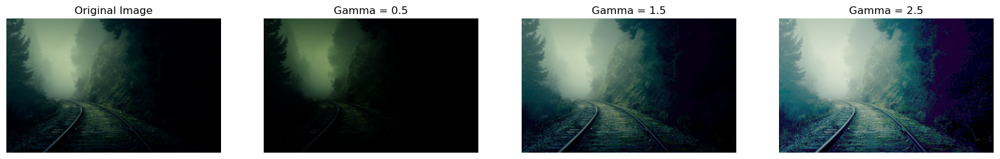

In [8]:
# Loading the image
image_path = "nature_dark_forest.jpg"
original = cv2.imread(image_path)
original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)  # Convert BGR (OpenCV default) to RGB for display

# Defining the adjust_gamma function
def adjust_gamma(image, gamma=1.0):
    """
    Apply gamma correction to an image.

    Parameters:
    - image: Input image
    - gamma: Gamma value for correction. Gamma < 1 darkens the image, Gamma > 1 brightens the image (default is 1, no change)

    Returns:
    - Gamma corrected image
    """
    # Building a lookup table mapping the pixel values [0, 255] to their adjusted gamma values
    invGamma = 1.0 / gamma # Inverse of the gamma value
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8") # Lookup table
    
    # Applying gamma correction using the lookup table
    return cv2.LUT(image, table) 

# Applying gamma correction with different gamma values
gamma_values = [0.5, 1.5, 2.5]
adjusted_images = [adjust_gamma(original, gamma=gamma) for gamma in gamma_values]

# Displaying the original and adjusted images
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(original)
axes[0].set_title("Original Image")
axes[0].axis('off')

for ax, gamma, img in zip(axes[1:], gamma_values, adjusted_images):
    ax.imshow(img)
    ax.set_title(f"Gamma = {gamma}")
    ax.axis('off')

plt.show()

We observe that by applying gamma correction with a gamma values greater than 1, the darker regions of the original image are brightened. This makes the details in the shadows more visible and enhances the perceived light, color and overall visibility of the image.

### Histogram Equalization

This technique enhances the contrast of an image by transforming the intensity values such that the histogram of the output image approximately matches a uniform distribution. Each pixel's new intensity is determined based on a transformation function derived from the cumulative distribution function (CDF) of the original image's histogram. Since this transformation function is applied uniformly to each pixel independently, it qualifies as a point operation.

Below is an implementation of the histogram equalization method for the provided "__nature_dark_forest.jpg__" image:

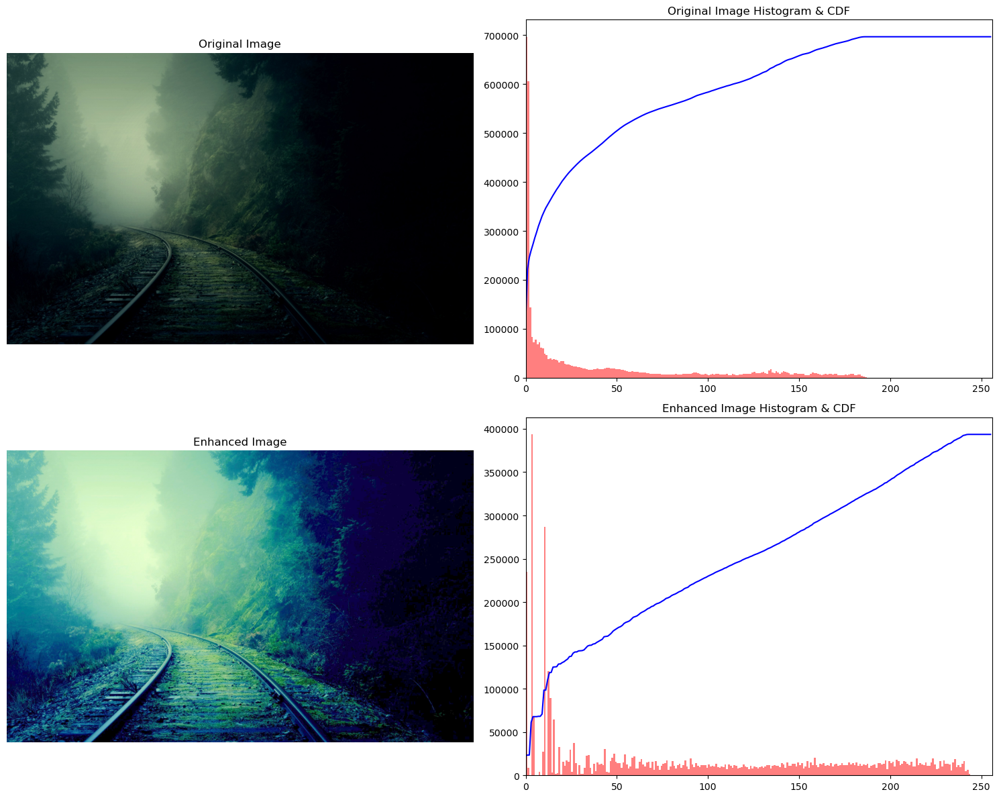

In [11]:
# Loading the image
image = cv2.imread("nature_dark_forest.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Converting to HSV color space
image_hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

# Applying histogram equalization to the V channel
image_hsv[:, :, 2] = cv2.equalizeHist(image_hsv[:, :, 2])

# Converting back to RGB color space
enhanced_image = cv2.cvtColor(image_hsv, cv2.COLOR_HSV2RGB)

# Function to compute and plot histogram and CDF
def plot_histogram_cdf(image, ax, title):
    # Computing the histogram
    hist, bins = np.histogram(image.flatten(), 256, [0, 256])

    # Computing the CDF
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()

    ax.plot(cdf_normalized, color='b')
    ax.hist(image.flatten(), 256, [0, 256], color='r', alpha=0.5)
    ax.set_xlim([0, 256])
    ax.set_title(title)

# Displaying the original and enhanced images with their histograms and CDFs
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

axes[0, 0].imshow(image)
axes[0, 0].set_title("Original Image")
axes[0, 0].axis('off')

plot_histogram_cdf(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY), axes[0, 1], "Original Image Histogram & CDF")

axes[1, 0].imshow(enhanced_image)
axes[1, 0].set_title("Enhanced Image")
axes[1, 0].axis('off')

plot_histogram_cdf(cv2.cvtColor(enhanced_image, cv2.COLOR_RGB2GRAY), axes[1, 1], "Enhanced Image Histogram & CDF")

plt.tight_layout()
plt.show()

Applying histogram equalization to the V (value) channel of an RGB image in the HSV color space enhances the overall brightness and contrast of the image. This process spreads out the most frequent intensity values, making dark areas lighter and bright areas more pronounced, resulting in an enhanced image in terms of perceived light and color, as well as improved visibility of details.

***

# <ins>Exercise 3</ins>

## _Propose a method for improving the image “__pollen-500x430px-96dpi.jpg__” in terms of the perceived brightness._

In [122]:
# Importing the necessary libraries
from PIL import Image
from IPython.display import display
import numpy as np
import cv2
from matplotlib import pyplot as plt

RGB


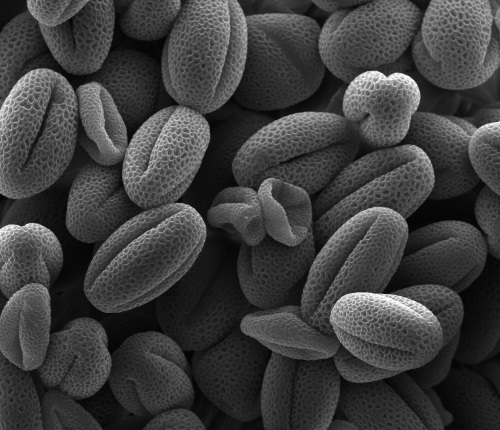

In [121]:
# Loading the image
image = Image.open("pollen-500x430px-96dpi.jpg")

# Displaying the image and its mode
print(image.mode)
display(image)


It appears that the "__pollen-500x430px-96dpi.jpg__" image only contains colors in the black and white spectrum, even though it is an RBG image. To test this, we plot the pixel intensities for each channel of the image:

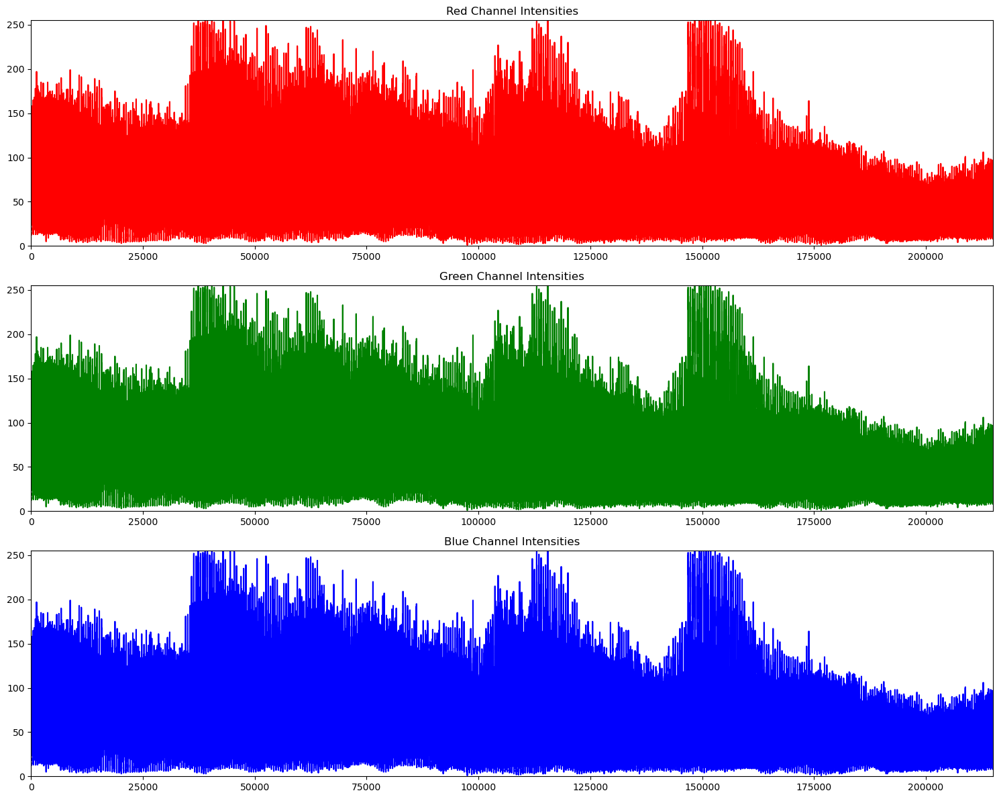

In [19]:
# Loading the image
image_path = "pollen-500x430px-96dpi.jpg" 
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Splitting the image into its red, green, and blue channels
R, G, B = cv2.split(image)

# Flattening the channels to 1D arrays
R_flat = R.flatten()
G_flat = G.flatten()
B_flat = B.flatten()

# Plotting the pixel intensities for each channel
fig, axes = plt.subplots(3, 1, figsize=(15, 12))

axes[0].plot(R_flat, color='r')
axes[0].set_title("Red Channel Intensities")
axes[0].set_xlim([0, len(R_flat)])
axes[0].set_ylim([0, 255])

axes[1].plot(G_flat, color='g')
axes[1].set_title("Green Channel Intensities")
axes[1].set_xlim([0, len(G_flat)])
axes[1].set_ylim([0, 255])

axes[2].plot(B_flat, color='b')
axes[2].set_title("Blue Channel Intensities")
axes[2].set_xlim([0, len(B_flat)])
axes[2].set_ylim([0, 255])

plt.tight_layout()
plt.show()


We can observe that each pixel's red, green, and blue components are equal, representing different intensities of light rather than distinct colors. In this case, treating this RGB image as a grayscale image makes sense because such an image lacks color information beyond shades of gray. Converting it to grayscale simplifies processing by reducing redundancy and focusing solely on the intensity variations, which are the primary visual elements in the image. 

To improve the grayscale version of the "__pollen-500x430px-96dpi.jpg__" image in terms of perceived brightness, we will employ the same approach as for the colored "__nature_dark_forest.jpg__" image, namely __gamma correction__ and __histogram equalization__.

### Gamma Correction

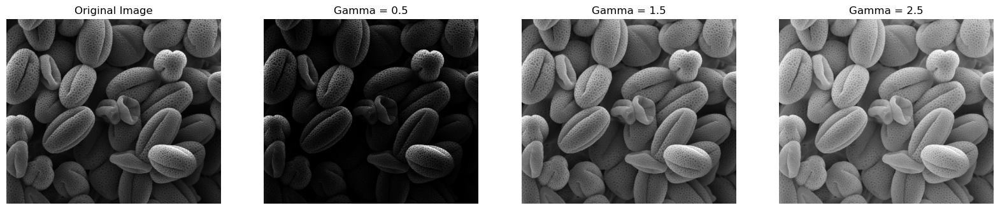

In [26]:
# Loading the image in grayscale
image_path = "pollen-500x430px-96dpi.jpg"
original = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Defining the adjust_gamma function
def adjust_gamma(image, gamma=1.0):
    """
    Apply gamma correction to an image.

    Parameters:
    - image: Input image
    - gamma: Gamma value for correction. Gamma < 1 darkens the image, Gamma > 1 brightens the image (default is 1, no change)

    Returns:
    - Gamma corrected image
    """
    # Building a lookup table mapping the pixel values [0, 255] to their adjusted gamma values
    invGamma = 1.0 / gamma # Inverse of the gamma value
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8") # Lookup table
    
    # Applying gamma correction using the lookup table
    return cv2.LUT(image, table) 

# Applying gamma correction with different gamma values
gamma_values = [0.5, 1.5, 2.5]
adjusted_images = [adjust_gamma(original, gamma=gamma) for gamma in gamma_values]

# Displaying the original and adjusted images
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(original, cmap='gray')
axes[0].set_title("Original Image")
axes[0].axis('off')

for ax, gamma, img in zip(axes[1:], gamma_values, adjusted_images):
    ax.imshow(img, cmap='gray')
    ax.set_title(f"Gamma = {gamma}")
    ax.axis('off')

plt.show()

Similarly to before, we observe that by applying gamma correction with a gamma values greater than 1, the darker regions of the original image are brightened. This makes the details in the shadows more visible and enhances the perceived brightness and overall visibility of the image.

### Histogram Equalization

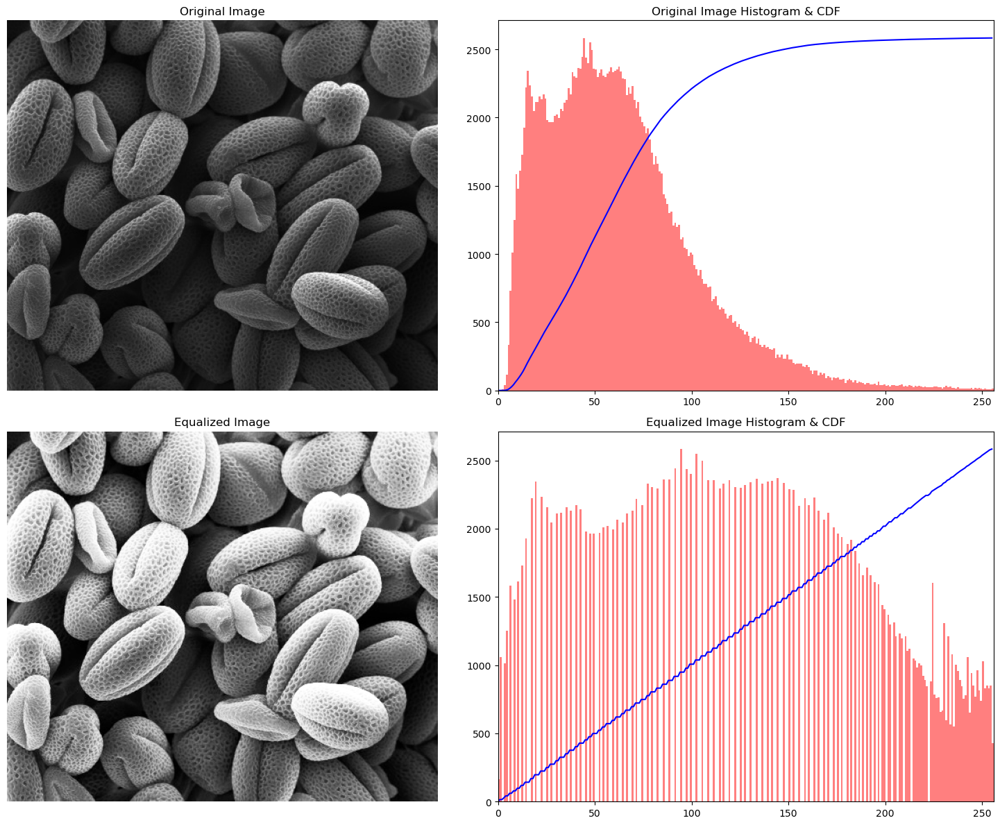

In [28]:
# Loading the image in grayscale
image_path = "pollen-500x430px-96dpi.jpg"
original = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Applying histogram equalization
equalized_image = cv2.equalizeHist(original)

# Function to compute and plot histogram and CDF
def plot_histogram_cdf(image, ax, title):
    # Computing the histogram
    hist, bins = np.histogram(image.flatten(), 256, [0, 256])

    # Computing the CDF
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()

    ax.plot(cdf_normalized, color='b')
    ax.hist(image.flatten(), 256, [0, 256], color='r', alpha=0.5)
    ax.set_xlim([0, 256])
    ax.set_title(title)

# Displaying the original and enhanced images with their histograms and CDFs
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

axes[0, 0].imshow(original, cmap='gray')
axes[0, 0].set_title("Original Image")
axes[0, 0].axis('off')

plot_histogram_cdf(original, axes[0, 1], "Original Image Histogram & CDF")

axes[1, 0].imshow(equalized_image, cmap='gray')
axes[1, 0].set_title("Equalized Image")
axes[1, 0].axis('off')

plot_histogram_cdf(equalized_image, axes[1, 1], "Equalized Image Histogram & CDF")

plt.tight_layout()
plt.show()

Similarly to before, histogram equalization enhances the contrast of this grayscale image by spreading out the most frequent intensity values, making dark areas lighter and bright areas more pronounced, thereby revealing more details in areas with low contrast and improving the perceived brighness and overall visibility of features in the image.

***

# <ins>Exercise 4</ins>

## _Propose a method for sharpening the image “__First-photo-of-the-moon-from-Chandrayaan-2_ISRO.jpg__”._

To sharpen the "__First-photo-of-the-moon-from-Chandrayaan-2_ISRO.jpg__" image, we can employ spatial domain filtering techniques, specifically neighborhood processing transformations such as __unsharp masking__ or __high boost filtering__.

In [123]:
# Importing the necessary libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt

### Unsharp Masking

Unsharp masking involves creating a blurred (low-pass filtered) version of the original image and then subtracting this blurred version from the original image to create a mask. This mask highlights the high-frequency components (edges and fine details) of the image. The mask is then added back to the original image, thereby enhancing the edges and fine details. This process effectively increases the contrast along edges and fine details, making these features stand out more sharply against the surrounding areas. By emphasizing high-frequency components, unsharp masking enhances the perception of sharpness.

Below is an implementation of the unsharp masking method for the provided "__First-photo-of-the-moon-from-Chandrayaan-2_ISRO.jpg__" image:

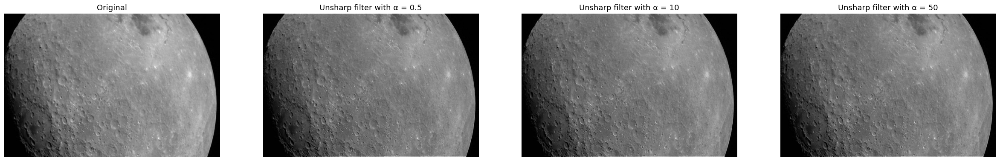

In [46]:
# Defining functions for unsharp masking
def unsharp(alpha=0.2):
    """
    Generate an unsharp masking kernel.

    Parameters:
    - alpha: Weight of the high-pass filter component (default is 0.2)

    Returns:
    - kernel: The unsharp masking kernel
    """
    A1 = np.array([[-1, 1, -1], [1, 1, 1], [-1, 1, -1]])
    A2 = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    return (alpha * A1 + A2) / (alpha + 1)

def apply_unsharp_masking(image_path, alpha_values):
    """
    Apply unsharp masking to an image with different alpha values.

    Parameters:
    - image_path: Path to the input image
    - alpha_values: List of alpha values to use for unsharp masking

    Displays the original and sharpened images.
    """
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    fig, axes = plt.subplots(1, len(alpha_values) + 1, figsize=(30, 14))
    
    axes[0].imshow(img, cmap='gray')
    axes[0].set_title('Original', fontsize=13)
    axes[0].axis('off')

    for i, alpha in enumerate(alpha_values):
        kernel = unsharp(alpha)
        dst = cv2.filter2D(img, -1, kernel, borderType=cv2.BORDER_CONSTANT)
        axes[i + 1].imshow(dst, cmap='gray')
        axes[i + 1].set_title(f'Unsharp filter with α = {alpha}', fontsize=13)
        axes[i + 1].axis('off')

    plt.show()

# Path to the input image
image_path = "First-photo-of-the-moon-from-Chandrayaan-2_ISRO.jpg"

# List of alpha values for unsharp masking
alpha_values = [0.5, 10, 50]

# Applying unsharp masking and displaying the results
apply_unsharp_masking(image_path, alpha_values)


We observe that a small increase in the alpha value leads to noticeable sharpness due to better edge enhancement. After a certain point, further increasing the alpha value results in diminishing returns in perceived sharpness because the image details and edges have already been sufficiently enhanced. For each image, there is an optimal range of alpha values that provide a good balance between sharpness and natural appearance without introducing noise or artifacts.

### High Boost Filtering

High boost filtering is an extension of unsharp masking. It includes a scaling factor that amplifies the high-frequency components (edges and fine details) more strongly. The procedure involves subtracting the blurred version of the image from a scaled version of the original image. By amplifying the high-frequency components, high boost filtering provides even stronger enhancement of edges and fine details compared to unsharp masking. The scaling factor allows for greater control over the degree of sharpening, making it possible to achieve more pronounced sharpening effects.

Below is an implementation of the high boost filtering method for the provided "__First-photo-of-the-moon-from-Chandrayaan-2_ISRO.jpg__" image:

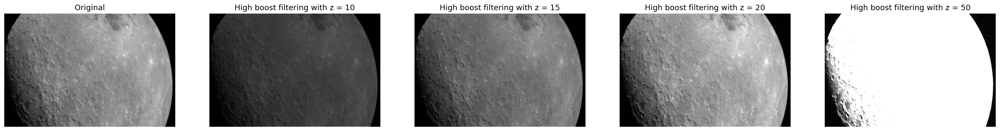

In [61]:
# Defining functions for high boost filtering
def high_boost_kernel(boost_factor):
    """
    Generate a high boost filtering kernel.

    Parameters:
    - boost_factor: The boost factor (z) to enhance the high-frequency components

    Returns:
    - kernel: The high boost filtering kernel
    """
    if boost_factor <= 8:
        raise ValueError("Boost factor should be greater than 8")
    
    kernel = -np.ones((3, 3), np.float32) / 9 # normalizing the kernel
    kernel[1, 1] = kernel[1, 1]*(-boost_factor)  # center element multiplied by the boost factor
    return kernel 

def apply_high_boost_filtering(image_path, boost_factors):
    """
    Apply high boost filtering to an image with different boost factors.

    Parameters:
    - image_path: Path to the input image
    - boost_factors: List of boost factors to use for high boost filtering

    Displays the original and sharpened images.
    """
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    fig, axes = plt.subplots(1, len(boost_factors) + 1, figsize=(30, 14))
    
    axes[0].imshow(img, cmap='gray')
    axes[0].set_title('Original', fontsize=13)
    axes[0].axis('off')

    for i, boost_factor in enumerate(boost_factors):
        kernel = high_boost_kernel(boost_factor)
        dst = cv2.filter2D(img, -1, kernel, borderType=cv2.BORDER_CONSTANT)
        axes[i + 1].imshow(dst, cmap='gray')
        axes[i + 1].set_title(f'High boost filtering with z = {boost_factor}', fontsize=13)
        axes[i + 1].axis('off')

    plt.show()

# Path to the input image
image_path = "First-photo-of-the-moon-from-Chandrayaan-2_ISRO.jpg"

# List of boost factors for high boost filtering
boost_factors = [10, 15, 20, 50]  # Ensure these factors are greater than 8

# Applying high boost filtering and displaying the results
apply_high_boost_filtering(image_path, boost_factors)

We observe that for boost factor values 15 and below, the images appear darker compared to the original, suggesting that the kernel might be overly suppressing the intensity values, leading to an unintended reduction in brightness. There is some enhancement in sharpness but the overall image quality is affected by the reduced brightness. A boost factor equal to 20 leads to a noticeable increase in sharpness compared to the original, without compromising the image quality. A boost factor equal to 50 shows a significant increase in sharpness, but the image appears overly bright, suggesting that the kernel might be amplifying the high-frequency components too much, leading to an unnatural appearance. There is an optimal range of boost factors for each image that achieve a good balance between enhancing the sharpness and maintaining the natural appearance of the image without introducing significant artifacts or brightness issues.

***

# <ins>Exercise 5</ins>

## _Someone combined spatial enhancement methods (e.g. arithmetic operations, gray level transformations, and/or sharpening spatial filters) to convert “__image_1.jpg__” to “__image_2.jpg__”. <br> <br> a) Try to guess the processing steps they adopted (note the dynamic range and brightness of the enhanced image, and the noise introduced)._

In [131]:
# Importing the necessary libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt

To figure out the processing steps used to convert "__image_1.jpg__" to "__image2.jpg__", we begin by plotting them and comparing their dynamic ranges:

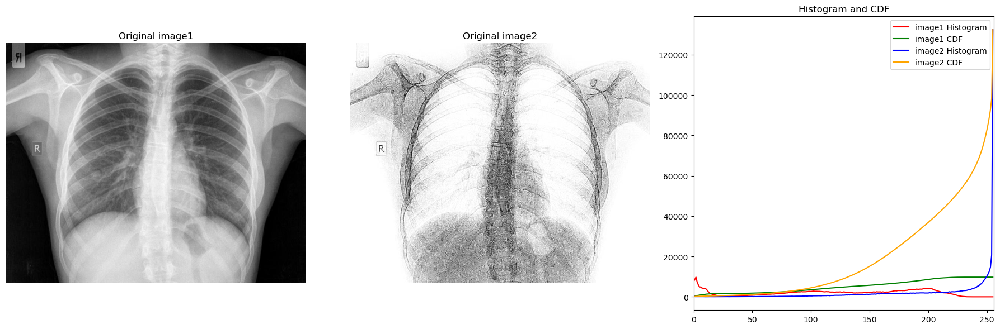

In [132]:
# Defining a function to examine the dynamic range
def dynamic_range(image, ax, hist_color, cdf_color, label):
    # Computing histogram
    hist, bins = np.histogram(image.flatten(), 256, [0, 256])
    
    # Computing CDF
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()
    
    # Plotting histogram
    ax.plot(hist, color=hist_color, label=f'{label} Histogram')
    ax.set_xlim([0, 256])
    
    # Plotting CDF
    ax.plot(cdf_normalized, color=cdf_color, label=f'{label} CDF')

# Loading the images in grayscale
image1 = cv2.imread("image_1.jpg", 0)
image2 = cv2.imread("image_2.jpg", 0)

# Displaying the images and their histograms/CDFs
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(image1, cmap='gray')
axes[0].set_title('Original image1')
axes[0].axis('off')

axes[1].imshow(image2, cmap='gray')
axes[1].set_title('Original image2')
axes[1].axis('off')

# Plotting histograms and CDFs
dynamic_range(image1, axes[2], hist_color='r', cdf_color='g', label='image1')
dynamic_range(image2, axes[2], hist_color='b', cdf_color='orange', label='image2')

axes[2].set_title('Histogram and CDF')
axes[2].legend()

plt.tight_layout()
plt.show()


It is clear that the "__image2.jpg__" is a negative version of "__image1.jpg__". However, merely converting it to a negative image is not sufficient due to the differences in their dynamic ranges, as shown by the above histogram. To address this, we apply gamma correction to darken "__image1.jpg__" and shift its intensity values towards 0, achieving a dynamic range that contrasts with "__image2.jpg__". This step allows us to perform the negative conversion effectively.

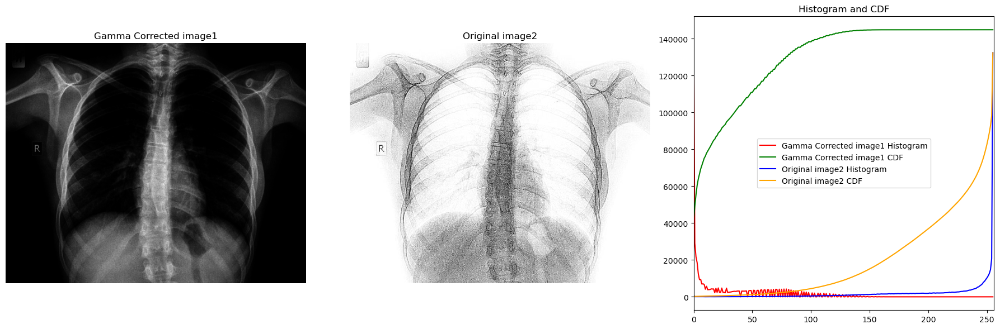

In [133]:
# Defining the adjust_gamma function
def adjust_gamma(image, gamma=1.0):
    """
    Apply gamma correction to an image.

    Parameters:
    - image: Input image
    - gamma: Gamma value for correction. Gamma < 1 darkens the image, Gamma > 1 brightens the image (default is 1, no change)

    Returns:
    - Gamma corrected image
    """
    # Building a lookup table mapping the pixel values [0, 255] to their adjusted gamma values
    invGamma = 1.0 / gamma # Inverse of the gamma value
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8") # Lookup table
    
    # Applying gamma correction using the lookup table
    return cv2.LUT(image, table) 

# Loading the images in grayscale
image1 = cv2.imread("image_1.jpg", 0)
image2 = cv2.imread("image_2.jpg", 0)

# Applying gamma correction to image1
gamma_value = 0.2  # Gamma value to darken the image
image1_gamma_corrected = adjust_gamma(image1, gamma_value)

# Displaying the images and their histograms/CDFs
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(image1_gamma_corrected, cmap='gray')
axes[0].set_title('Gamma Corrected image1')
axes[0].axis('off')

axes[1].imshow(image2, cmap='gray')
axes[1].set_title('Original image2')
axes[1].axis('off')

# Plot histograms and CDFs
dynamic_range(image1_gamma_corrected, axes[2], hist_color='r', cdf_color='g', label='Gamma Corrected image1')
dynamic_range(image2, axes[2], hist_color='b', cdf_color='orange', label='Original image2')

axes[2].set_title('Histogram and CDF')
axes[2].legend()

plt.tight_layout()
plt.show()

By achieving the opposite dynamic range, the negative representation of the original image can be obtained by subtracting the original image from an image with a consistent intensity value of 255.

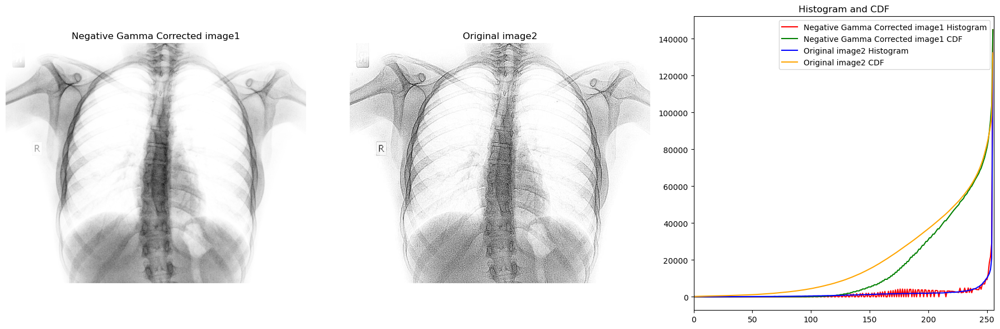

In [134]:
# Applying negative transformation to the gamma corrected image1
image1_negative = 255 - image1_gamma_corrected

# Displaying the images and their histograms/CDFs
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(image1_negative, cmap='gray')
axes[0].set_title('Negative Gamma Corrected image1')
axes[0].axis('off')

axes[1].imshow(image2, cmap='gray')
axes[1].set_title('Original image2')
axes[1].axis('off')

# Plot histograms and CDFs
dynamic_range(image1_negative, axes[2], hist_color='r', cdf_color='g', label='Negative Gamma Corrected image1')
dynamic_range(image2, axes[2], hist_color='b', cdf_color='orange', label='Original image2')

axes[2].set_title('Histogram and CDF')
axes[2].legend()

plt.tight_layout()
plt.show()

The modified "__image1.jpg__", after gamma correction and inversion, has a similar intensity range but lacks the sharpness and contrast seen in "__image2.jpg__". A high pass filter can be used to transition from the modified "__image1.jpg__" to "__image2.jpg__" because it emphasizes high-frequency components, such as edges and fine details, while suppressing low-frequency components, resulting in increased sharpness and contrast that match the characteristics of "__image2.jpg__", as evidenced by its pronounced edges and noise.

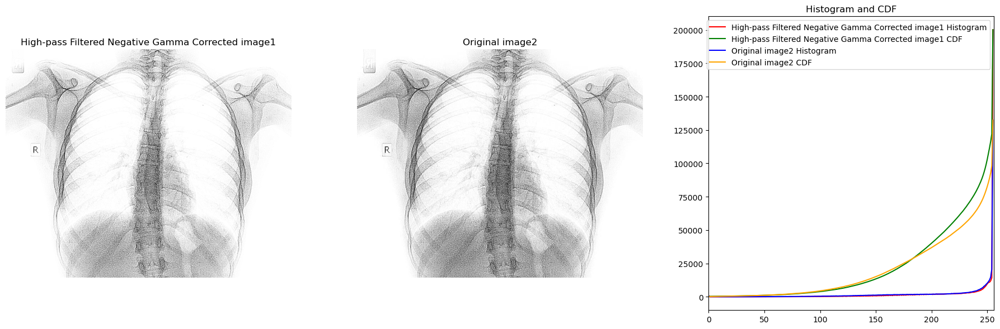

In [139]:
# Defining a high-pass filter kernel (highligts central pixel and its immediate neighbors while suppressing the rest - sharpening)
kernel = np.array([[-1, -1, -1],
                   [-1,  9, -1],
                   [-1, -1, -1]], dtype=np.float32)

# Applying the high-pass filter to the negative gamma-corrected image1
image1_high_pass = cv2.filter2D(image1_negative, -1, kernel)

# Displaying the images and their histograms/CDFs
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(image1_high_pass, cmap='gray')
axes[0].set_title('High-pass Filtered Negative Gamma Corrected image1')
axes[0].axis('off')

axes[1].imshow(image2, cmap='gray')
axes[1].set_title('Original image2')
axes[1].axis('off')

# Plotting histograms and CDFs
dynamic_range(image1_high_pass, axes[2], hist_color='r', cdf_color='g', label='High-pass Filtered Negative Gamma Corrected image1')
dynamic_range(image2, axes[2], hist_color='b', cdf_color='orange', label='Original image2')

axes[2].set_title('Histogram and CDF')
axes[2].legend()

plt.tight_layout()
plt.show()

It is evident that the resulting image closely resembles "__image2.jpg__".

To summarize, the processing steps to convert "__image1.jpg__" to "__image2.jpg__" could have been, in order:

* __Gamma correction__ (to achieve opposite dynamic ranges)
* __Negation__
* __High-pass filtering__ (to sharpen)

## _b) Propose a pipeline of processes with the aim of approximating “__image_1__” starting from “__image_2__”._

To do the opposite transformation, we will perform the reverse operations in reverse order.

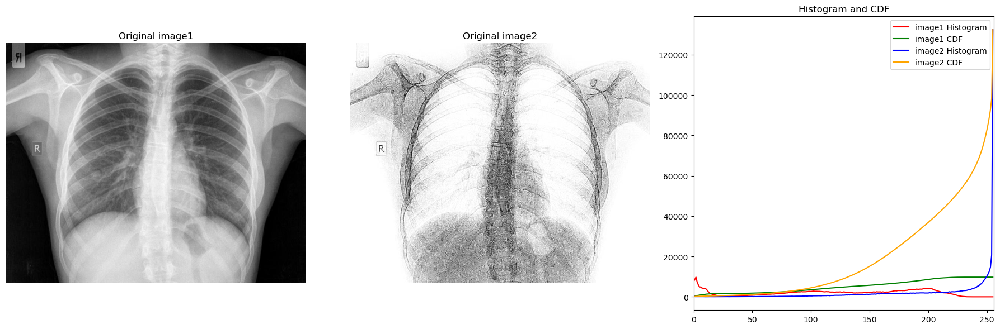

In [140]:
# Loading the images in grayscale
image1 = cv2.imread("image_1.jpg", 0)
image2 = cv2.imread("image_2.jpg", 0)

# Displaying the images and their histograms/CDFs
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(image1, cmap='gray')
axes[0].set_title('Original image1')
axes[0].axis('off')

axes[1].imshow(image2, cmap='gray')
axes[1].set_title('Original image2')
axes[1].axis('off')

# Plotting histograms and CDFs
dynamic_range(image1, axes[2], hist_color='r', cdf_color='g', label='image1')
dynamic_range(image2, axes[2], hist_color='b', cdf_color='orange', label='image2')

axes[2].set_title('Histogram and CDF')
axes[2].legend()

plt.tight_layout()
plt.show()

We begin by applying Gaussian blur to undo the sharpening and enhance low-frequency areas of "__image2.jpg__".

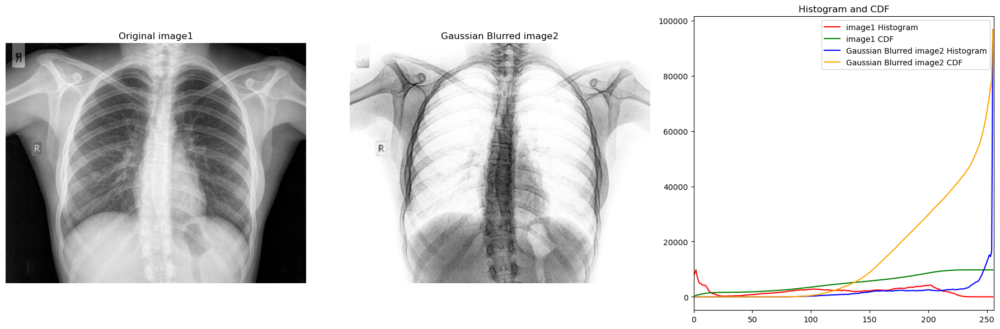

In [142]:
# Applying Gaussian blur to image2
image2_blurred = cv2.GaussianBlur(image2, (7, 7), 0) # Kernel size (7, 7) and standard deviation 0

# Displaying the images and their histograms/CDFs
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(image1, cmap='gray')
axes[0].set_title('Original image1')
axes[0].axis('off')

axes[1].imshow(image2_blurred, cmap='gray')
axes[1].set_title('Gaussian Blurred image2')
axes[1].axis('off')

# Plotting histograms and CDFs
dynamic_range(image1, axes[2], hist_color='r', cdf_color='g', label='image1')
dynamic_range(image2_blurred, axes[2], hist_color='b', cdf_color='orange', label='Gaussian Blurred image2')

axes[2].set_title('Histogram and CDF')
axes[2].legend()

plt.tight_layout()
plt.show()

We then transform the Gaussian blurred "__image2.jpg__" to its negative representation.

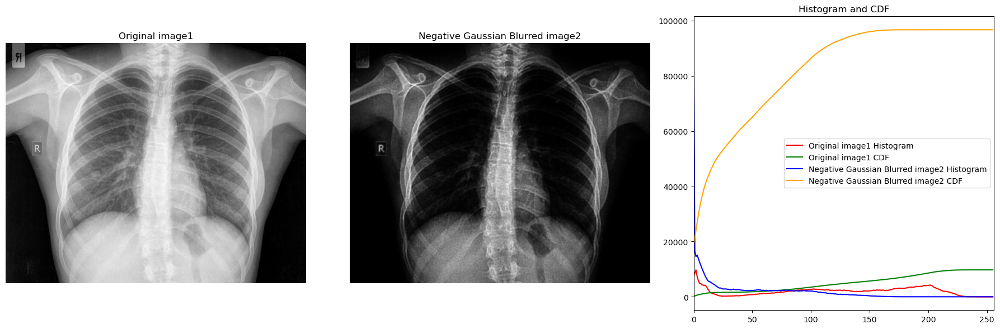

In [144]:
# Applying negative transformation to the Gaussian blurred image2
image2_negative = 255 - image2_blurred

# Displaying the images and their histograms/CDFs
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(image1, cmap='gray')
axes[0].set_title('Original image1')
axes[0].axis('off')

axes[1].imshow(image2_negative, cmap='gray')
axes[1].set_title('Negative Gaussian Blurred image2')
axes[1].axis('off')

# Plot histograms and CDFs
dynamic_range(image1, axes[2], hist_color='r', cdf_color='g', label='Original image1')
dynamic_range(image2_negative, axes[2], hist_color='b', cdf_color='orange', label='Negative Gaussian Blurred image2')

axes[2].set_title('Histogram and CDF')
axes[2].legend()

plt.tight_layout()
plt.show()

Finally, we apply Gamma correction to brighten the negative Gaussian blurred "__image2.jpg__".

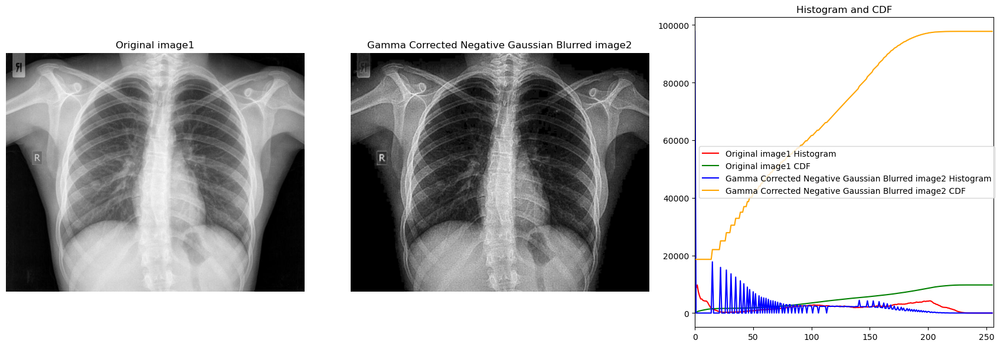

In [158]:
# Applying gamma correction to the modified image2
gamma_value = 2  # Gamma value to brighten the image
image2_gamma_corrected = adjust_gamma(image2_negative, gamma_value)

# Displaying the images and their histograms/CDFs
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(image1, cmap='gray')
axes[0].set_title('Original image1')
axes[0].axis('off')

axes[1].imshow(image2_gamma_corrected, cmap='gray')
axes[1].set_title('Gamma Corrected Negative Gaussian Blurred image2')
axes[1].axis('off')

# Plot histograms and CDFs
dynamic_range(image1, axes[2], hist_color='r', cdf_color='g', label='Original image1')
dynamic_range(image2_gamma_corrected, axes[2], hist_color='b', cdf_color='orange', label='Gamma Corrected Negative Gaussian Blurred image2')

axes[2].set_title('Histogram and CDF')
axes[2].legend()

plt.tight_layout()
plt.show()

This is as close as we can get with Gamma correction alone. One additional step we could try is to apply a technique called histogram matching.

Histogram matching, also known as histogram specification, is a technique used in image processing to adjust the pixel intensity distribution of one image so that its histogram matches the histogram of another image. This process involves transforming the input image such that its cumulative distribution function (CDF) closely aligns with the CDF of the reference image, thereby making the two images visually similar in terms of brightness and contrast.

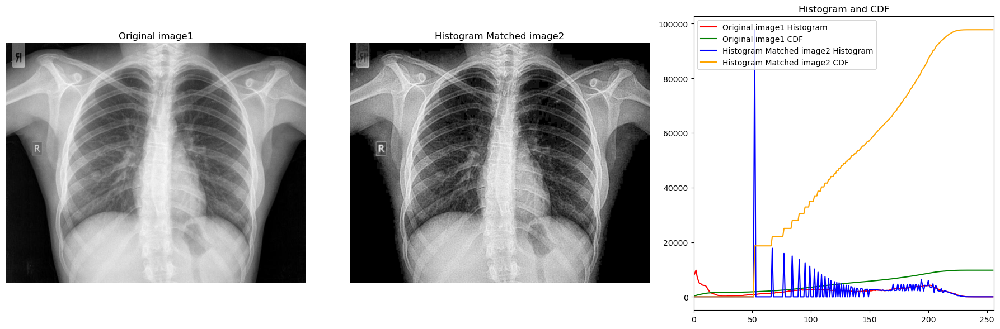

In [161]:
# Applying histogram matching to the modified image2 to align with the original image1
from skimage import exposure
matched_image = exposure.match_histograms(image2_gamma_corrected, image1)

# Displaying the images and their histograms/CDFs
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(image1, cmap='gray')
axes[0].set_title('Original image1')
axes[0].axis('off')

axes[1].imshow(matched_image, cmap='gray')
axes[1].set_title('Histogram Matched image2')
axes[1].axis('off')

# Plot histograms and CDFs
dynamic_range(image1, axes[2], hist_color='r', cdf_color='g', label='Original image1')
dynamic_range(matched_image, axes[2], hist_color='b', cdf_color='orange', label='Histogram Matched image2')

axes[2].set_title('Histogram and CDF')
axes[2].legend()

plt.tight_layout()
plt.show()


This result is an improvement (and as good as we could get it to be), but it's still far from the original "__image1.jpg__". We conclude that the process of transforming "__image2.jpg__" back to "__image1.jpg__" is significantly more challenging that the other way around.

***

# <ins>Exercise 6</ins>

## _a. Find the main edges of __image11.jpg__._

In [ ]:
# Importing the necessary libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt

The Canny edge detector is widely considered the best method for edge detection among techniques such as Prewitt filters, Roberts filters, Sobel filters, Laplacian filters, and LoG filters due to its comprehensive approach and effectiveness in meeting critical edge detection criteria. Unlike the aforementioned methods, the Canny edge detector excels in minimizing errors by accurately detecting true edges while reducing the detection of false edges. It achieves high localization accuracy, ensuring the detected edges are as close as possible to the actual edges in the image. The Canny method also provides a single response to edge detection, avoiding multiple responses for a single edge. It combines Gaussian smoothing to reduce noise, computes gradients for edge strength and direction, and uses non-maximum suppression to thin edges. Additionally, hysteresis thresholding further refines edge detection by linking edges based on high and low thresholds, enhancing robustness. These steps collectively make the Canny edge detector superior in delivering precise and reliable edge detection results.

Below is an implementation of the Canny edge detector for the provided "__image11.jpg__" image:

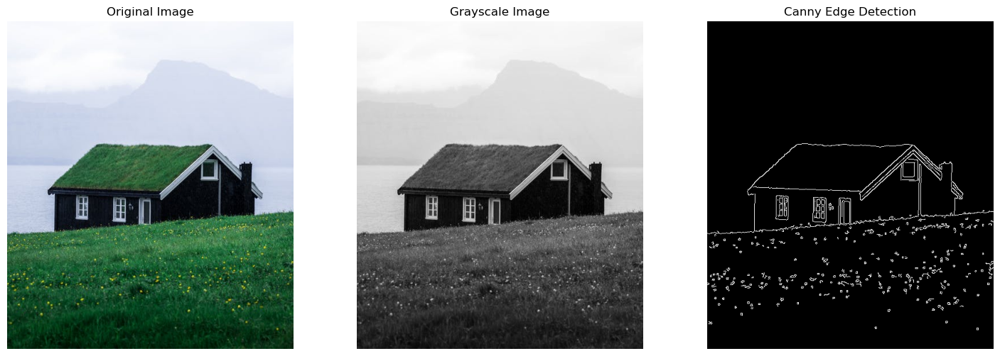

In [190]:
# Defining the Canny edge detection function
def apply_canny_edge_detection(image_path, t_L=100, t_H=200):
    """
    Apply the Canny edge detector to an RGB image and return the results.

    Parameters:
    - image_path: Path to the input image
    - t_L: Lower threshold for the hysteresis procedure
    - t_H: Upper threshold for the hysteresis procedure

    Returns:
    - img_rgb: Original RGB image
    - img_gray: Grayscale image
    - img_canny: Canny edge detected image
    """
    # Loading the image in RGB
    img_rgb = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB)
    
    # Converting to grayscale
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    
    # Applying Gaussian blur to the grayscale image
    img_gaussian = cv2.GaussianBlur(img_gray, (3, 3), 0)
    
    # Applying Canny edge detector
    img_canny = cv2.Canny(img_gaussian, t_L, t_H)
    
    return img_rgb, img_gray, img_canny

# Path to the input image
image_path = "image11.jpg"

# Applying Canny edge detection
img_rgb, img_gray, img_canny = apply_canny_edge_detection(image_path, t_L=110, t_H=210)

# Plotting the results
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(img_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(img_gray, cmap='gray')
axes[1].set_title('Grayscale Image')
axes[1].axis('off')

axes[2].imshow(img_canny, cmap='gray')
axes[2].set_title('Canny Edge Detection')
axes[2].axis('off')

plt.show()

We observe that for these values of the lower and upper hysterisis thresholds, the Canny edge detector performs amazingly well when it comes to finding the main edges of this image.

## _b. Estimate the angle (with respect to the horizontal axis) of the diagonal edges of the roof._

To estimate the angle of the diagonal edges of the roof in the image, we will use the Hough Line Detector. This technique is useful in this case because it effectively identifies and extracts prominent linear features, such as the roof edges, from the edge-detected image despite the presence of noise and other structures. We will apply the Hough Line Detector to detect diagonal lines in the edge-detected image and compute the angles of these lines with respect to the horizontal axis.

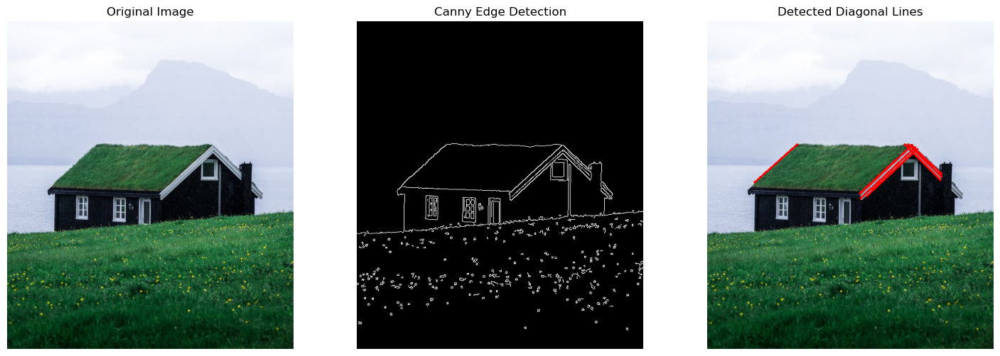

Estimated angles of the detected diagonal lines (in degrees):
[-43.00212014352333, -43.069412558833, -43.1523897340054, -41.775477393480095, 44.012239600360196, 45.0, -42.436229788534995, -43.05851360908562, 43.36342295838329]


In [173]:
# Defining a function to detect diagonal lines and estimate their angles
def detect_diagonal_lines_and_estimate_angles(img_rgb, img_canny):
    """
    Apply the Hough Line Detector to detect diagonal lines in the edge-detected image and estimate their angles.

    Parameters:
    - img_rgb: The original RGB image
    - img_canny: The edge-detected image using Canny

    Returns:
    - img_lines: Image with detected lines drawn
    - angles: List of estimated angles of the detected diagonal lines
    """
    # Applying Hough Line Detector to detect lines
    lines = cv2.HoughLinesP(img_canny, 1, np.pi / 180, threshold=50, minLineLength=50, maxLineGap=10)
    
    # Plotting the lines on the original image
    img_lines = img_rgb.copy()
    diagonal_lines = []
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            angle = np.arctan2((y2 - y1), (x2 - x1)) * 180 / np.pi
            # Only keep lines with angles between 20 to 70 degrees and -20 to -70 degrees (diagonal)
            if 20 < abs(angle) < 70:
                cv2.line(img_lines, (x1, y1), (x2, y2), (255, 0, 0), 2) # Draw the line on the image, red color, thickness 2
                diagonal_lines.append(angle)
    
    return img_lines, diagonal_lines

# Detecting diagonal lines and estimating their angles
img_lines, angles = detect_diagonal_lines_and_estimate_angles(img_rgb, img_canny)

# Plotting the results
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(img_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(img_canny, cmap='gray')
axes[1].set_title('Canny Edge Detection')
axes[1].axis('off')

axes[2].imshow(img_lines)
axes[2].set_title('Detected Diagonal Lines')
axes[2].axis('off')

plt.show()

# Printing the estimated angles
print("Estimated angles of the detected diagonal lines (in degrees):")
print(angles)

## _c. Find the corners of the __image11.jpg__._

For this task, we will use the Harris Corner Detector, which is appropriate for detecting corners because it identifies points in the image where the intensity changes significantly in all directions. Corners are characterized by high variation in pixel intensity in orthogonal directions, making the Harris Corner Detector well-suited for this task as it uses this variation to precisely locate corner points.

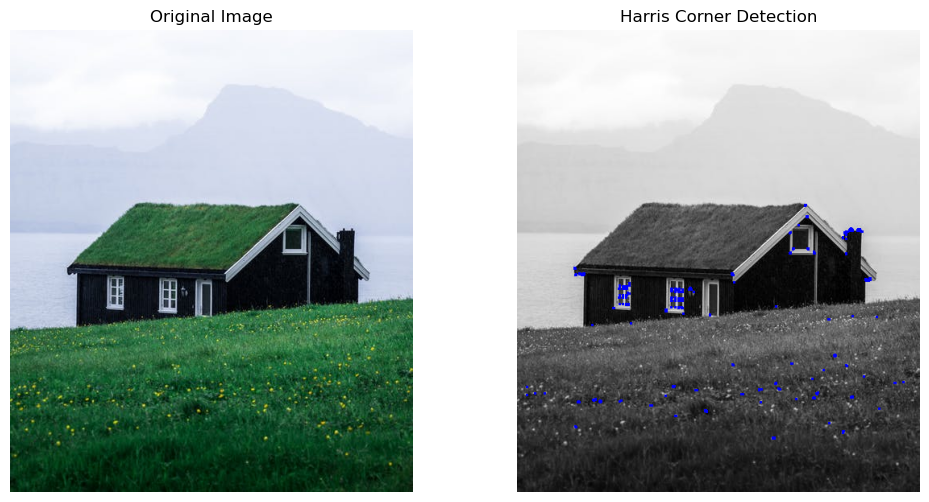

In [198]:
# Defining the Harris Corner detection function
def apply_harris_corner_detection(image, block_size=2, ksize=3, k=0.04):
    """
    Apply Harris Corner detection to a grayscale image.

    Parameters:
    - image: Input grayscale image
    - block_size: Size of the neighborhood considered for corner detection
    - ksize: Aperture parameter of the Sobel derivative used
    - k: Harris detector free parameter in the equation

    Returns:
    - corners_img: Original image with detected corners marked in red
    - dst: Corner strength map
    """
    gray = np.float32(image)
    dst = cv2.cornerHarris(gray, block_size, ksize, k)
    
    # Result is dilated for marking the corners
    dst = cv2.dilate(dst, None)
    
    # Threshold for an optimal value
    corners_img = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    corners_img[dst > 0.1 * dst.max()] = [0, 0, 255]
    
    return corners_img, dst

# Loading the image
image_path = "image11.jpg"
img_rgb = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB)

# Converting to grayscale
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

# Applying Harris Corner Detection
harris_corners_img, corner_strength = apply_harris_corner_detection(img_gray)

# Displaying the results
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(img_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(harris_corners_img)
axes[1].set_title('Harris Corner Detection')
axes[1].axis('off')

plt.show()


## _d. Based on the detected corners, locate the windows._

To locate the windows based on the detected corners, we can use the detected corners to find clusters of corners that form rectangular shapes, which would correspond to the windows.

(-0.5, 499.5, 573.5, -0.5)

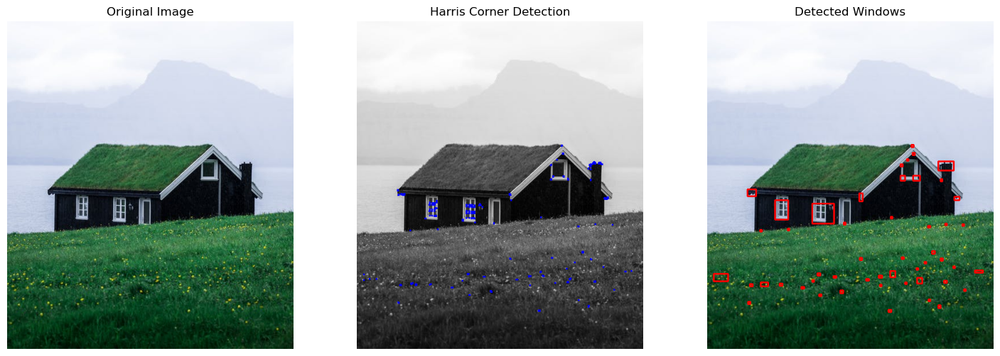

In [199]:
# Locate windows based on detected corners
def locate_windows(image, corner_strength, threshold=0.1, min_size=3):
    corners = np.argwhere(corner_strength > threshold * corner_strength.max())
    
    # Using DBSCAN for better clustering
    from sklearn.cluster import DBSCAN
    db = DBSCAN(eps=10, min_samples=5).fit(corners)
    labels = db.labels_
    
    unique_labels = set(labels)
    windows_img = image.copy()
    rects = []
    
    for label in unique_labels:
        if label == -1:
            continue
        class_member_mask = (labels == label)
        xy = corners[class_member_mask]
        
        if len(xy) > min_size:  # Only consider clusters with a sufficient number of points
            x, y, w, h = cv2.boundingRect(np.array(xy))
            cv2.rectangle(windows_img, (y, x), (y + h, x + w), (255, 0, 0), 2)
            rects.append((y, x, y + h, x + w))
    
    return windows_img, rects

# Locate windows based on detected corners
windows_img, windows = locate_windows(img_rgb, corner_strength)

# Display the results
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(img_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(harris_corners_img)
axes[1].set_title('Harris Corner Detection')
axes[1].axis('off')

axes[2].imshow(windows_img)
axes[2].set_title('Detected Windows')
axes[2].axis('off')

This has proven to be rather difficult. Even though it detects the two main windows, it also has a lot of false positives.

***

# <ins>Exercise 7</ins>

## _a. Estimate the angle with respect to the horizontal axis of the billiard cue in __image31.png__. To verify your answer, rotate the input image accordingly. The result should be similar to __image32.png__._

In [205]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

To estimate the angle of the billiard cue with respect to the horizontal axis and rotate the input image accordingly, we can use the Hough Line Transform to detect the cue, compute the angle, and then apply a rotation to the image. Here's how we can do it:

1. Detect edges in the image using the Canny edge detector.
2. Use the Hough Line Transform to detect the lines in the image.
3. Identify the line corresponding to the billiard cue.
4. Compute the angle of the cue with respect to the horizontal axis.
5. Rotate the image by the computed angle.

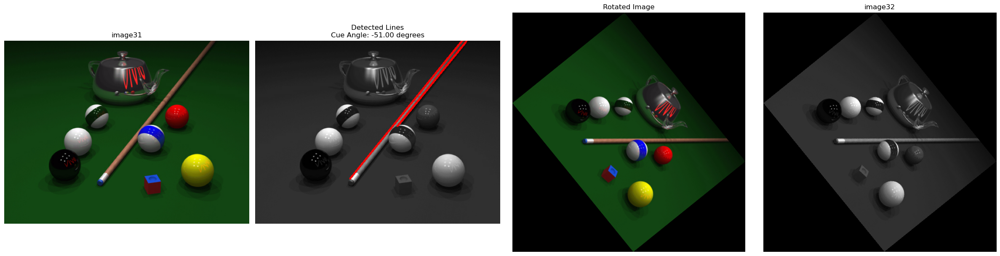

In [204]:
# Defining function to detect billiard cue angle
def detect_billiard_cue_angle(image_path, t_L=50, t_H=150):
    # Load the image in grayscale
    img_gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply Canny edge detection
    img_edges = cv2.Canny(img_gray, t_L, t_H)

    # Apply Hough Line Transform to detect lines
    lines = cv2.HoughLinesP(img_edges, 1, np.pi / 180, threshold=100, minLineLength=100, maxLineGap=10)

    # Plot the detected lines
    img_lines = cv2.cvtColor(img_gray, cv2.COLOR_GRAY2BGR)
    max_length = 0
    cue_angle = 0

    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(img_lines, (x1, y1), (x2, y2), (0, 0, 255), 2)
            length = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
            if length > max_length:
                max_length = length
                cue_angle = np.arctan2((y2 - y1), (x2 - x1)) * 180 / np.pi

    return img_lines, cue_angle

# Defining function to rotate the image
def rotate_image(image_path, angle):
    # Load the image
    img = cv2.imread(image_path)
    (h, w) = img.shape[:2]
    center = (w // 2, h // 2)

    # Compute the rotation matrix
    M = cv2.getRotationMatrix2D(center, angle, 1.0)

    # Compute the size of the new image
    cos = np.abs(M[0, 0])
    sin = np.abs(M[0, 1])
    new_w = int((h * sin) + (w * cos))
    new_h = int((h * cos) + (w * sin))

    # Adjust the rotation matrix to consider the translation
    M[0, 2] += (new_w / 2) - center[0]
    M[1, 2] += (new_h / 2) - center[1]

    # Perform the rotation
    rotated_img = cv2.warpAffine(img, M, (new_w, new_h))

    return rotated_img

# Path to the input image
image31_path = "image31.png"
image32_path = "image32.png"

# Detecting the billiard cue angle
img_lines, cue_angle = detect_billiard_cue_angle(image31_path)

# Rotating the image to align the cue with the horizontal axis
rotated_img = rotate_image(image31_path, cue_angle)

# Loading image32 for comparison
img32 = cv2.imread(image32_path)
img32 = cv2.cvtColor(img32, cv2.COLOR_BGR2RGB)

# Displaying the results
fig, axes = plt.subplots(1, 4, figsize=(24, 6))

axes[0].imshow(cv2.cvtColor(cv2.imread(image31_path), cv2.COLOR_BGR2RGB))
axes[0].set_title('image31')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(img_lines, cv2.COLOR_BGR2RGB))
axes[1].set_title(f'Detected Lines\nCue Angle: {cue_angle:.2f} degrees')
axes[1].axis('off')

axes[2].imshow(cv2.cvtColor(rotated_img, cv2.COLOR_BGR2RGB))
axes[2].set_title('Rotated Image')
axes[2].axis('off')

axes[3].imshow(img32)
axes[3].set_title('image32')
axes[3].axis('off')

plt.tight_layout()
plt.show()


## _b. Combine __image31.png__ and __image32.png__ to generate an image similar to __image33.png__._

To combine "__image31.png__" and image "__image32.png__". to generate an image similar to "__image33.png__", we can use the color information from the RGB image without relying on the color intensity value. By creating a mask and applying it to the grayscale image, we can achieve the final result.

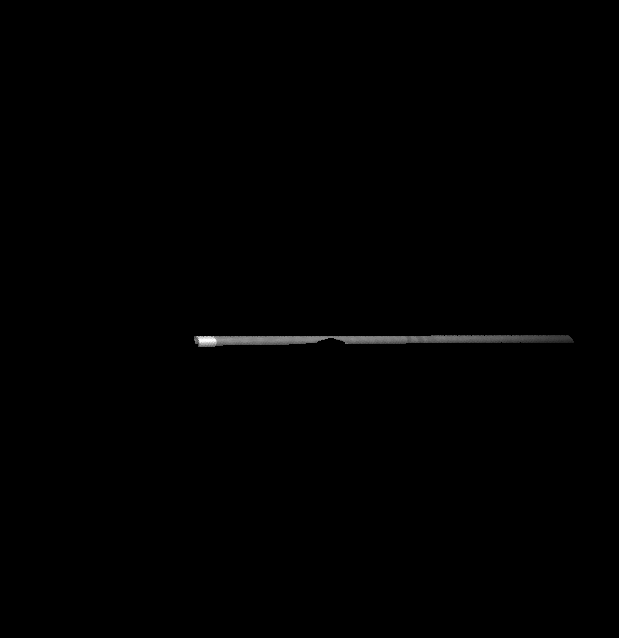

In [213]:
# Loading image33.png
image33 = Image.open("image33.png")

# Displaying the image
display(image33)

This involves using the Hue and Saturation channels from the HSV color space to accomplish the task. The Hue and Saturation channels provide information about the colors in the BGR image, while the Value channel represents intensity, similar to the grayscale image. We blur the image to reduce noise and convert it from the RGB to HSV space, and then display the channels along with their respective histograms.

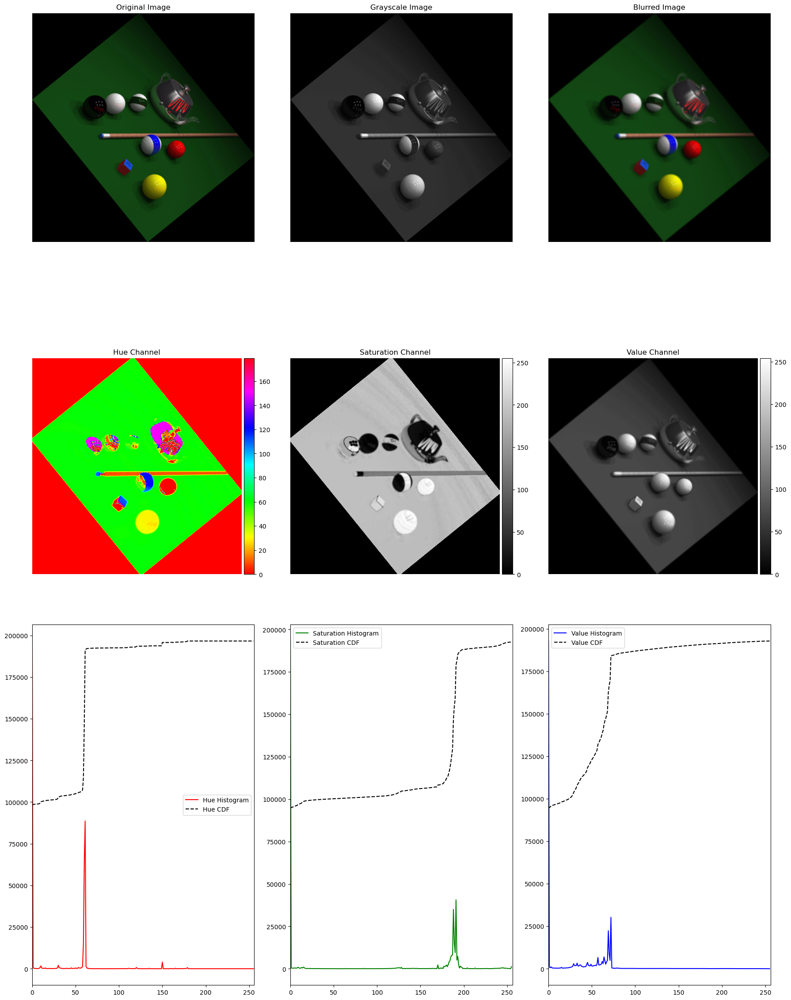

In [223]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Function to plot histograms and CDFs
def plot_histogram_and_cdf(channel, ax, color, label):
    hist, bins = np.histogram(channel.flatten(), 256, [0, 256])
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()
    
    ax.plot(hist, color=color, label=f'{label} Histogram')
    ax.plot(cdf_normalized, color='black', linestyle='dashed', label=f'{label} CDF')
    ax.set_xlim([0, 256])
    ax.legend()

# Converting to grayscale
img1_gray = cv2.cvtColor(rotated_img, cv2.COLOR_BGR2GRAY)

# Applying Gaussian blur to the grayscale image
img1_blurred = cv2.GaussianBlur(rotated_img, (7, 7), 0)

# Converting the blurred image to HSV
img_hsv = cv2.cvtColor(img1_blurred, cv2.COLOR_BGR2HSV)

# Splitting HSV channels
hue, saturation, value = cv2.split(img_hsv)

# Plotting the HSV channels and their histograms/CDFs
fig, axes = plt.subplots(3, 3, figsize=(18, 24))

# Plotting the images
axes[0, 0].imshow(cv2.cvtColor(rotated_img, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(img1_gray, cmap='gray')
axes[0, 1].set_title('Grayscale Image')
axes[0, 1].axis('off')

axes[0, 2].imshow(cv2.cvtColor(img1_blurred, cv2.COLOR_BGR2RGB))
axes[0, 2].set_title('Blurred Image')
axes[0, 2].axis('off')

# Plotting the HSV channels
im_hue = axes[1, 0].imshow(hue, cmap='hsv')
axes[1, 0].set_title('Hue Channel')
axes[1, 0].axis('off')
divider = make_axes_locatable(axes[1, 0])
cax_hue = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im_hue, cax=cax_hue)

im_saturation = axes[1, 1].imshow(saturation, cmap='gray')
axes[1, 1].set_title('Saturation Channel')
axes[1, 1].axis('off')
divider = make_axes_locatable(axes[1, 1])
cax_saturation = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im_saturation, cax=cax_saturation)

im_value = axes[1, 2].imshow(value, cmap='gray')
axes[1, 2].set_title('Value Channel')
axes[1, 2].axis('off')
divider = make_axes_locatable(axes[1, 2])
cax_value = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im_value, cax=cax_value)

# Plotting histograms and CDFs
plot_histogram_and_cdf(hue, axes[2, 0], 'r', 'Hue')
plot_histogram_and_cdf(saturation, axes[2, 1], 'g', 'Saturation')
plot_histogram_and_cdf(value, axes[2, 2], 'b', 'Value')

plt.tight_layout()
plt.show()

In the Hue channel, the billiard cue exhibits values between 8 and 20. We use this information to create a mask for this channel.

Similarly, in the Saturation channel, the billiard cue has values ranging between 110 and 150.

We can combine the two filtered images to create our final mask for the main billiard cue, eliminating elements that do not meet the isolation criteria for both channels, and then isolate only the black pixels.

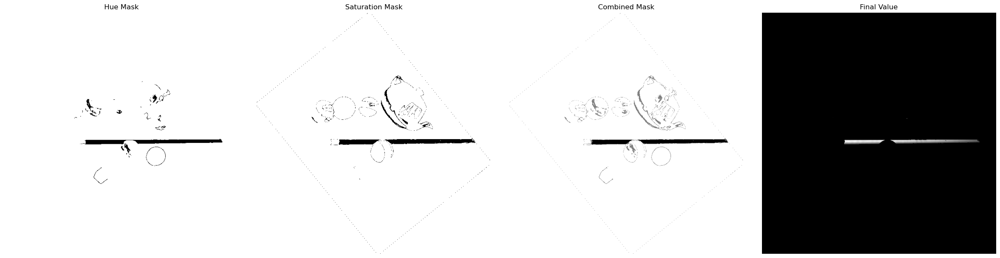

In [224]:
# Creating a hue mask for the billiard cue
hue_mask = ((hue >= 8) & (hue <= 20))
hue_tmp = np.where(hue_mask, 0, 255)

# Creating a saturation mask for the billiard cue
saturation_mask = (saturation > 110) & (saturation < 130)
saturation_tmp = np.where(saturation_mask, 0, 255)

# Combining the hue and saturation masks
combined_tmp = cv2.addWeighted(saturation_tmp, 1, hue_tmp, 1, 1)

# Creating a final billiard cue filter
billiard_cue_filter = np.where(combined_tmp <= 1, 0, 255)

# Applying the final filter to the value channel (keeping only the black pixels)
final_value = np.where(combined_tmp <= 1, value, 0)

# Plotting the results
fig, axes = plt.subplots(1, 4, figsize=(24, 6))

# Plotting hue mask
axes[0].imshow(hue_tmp, cmap='gray')
axes[0].set_title('Hue Mask')
axes[0].axis('off')

# Plotting saturation mask
axes[1].imshow(saturation_tmp, cmap='gray')
axes[1].set_title('Saturation Mask')
axes[1].axis('off')

# Plotting combined mask
axes[2].imshow(combined_tmp, cmap='gray')
axes[2].set_title('Combined Mask')
axes[2].axis('off')

# Plotting final value
axes[3].imshow(final_value, cmap='gray')
axes[3].set_title('Final Value')
axes[3].axis('off')

plt.tight_layout()
plt.show()

Finally, we apply the mask created from the color space of "__image31.png__" to "__image32.png__", using the value channel of the HSV representation of "__image31.png__", to isolate the main part of the billiard cue.

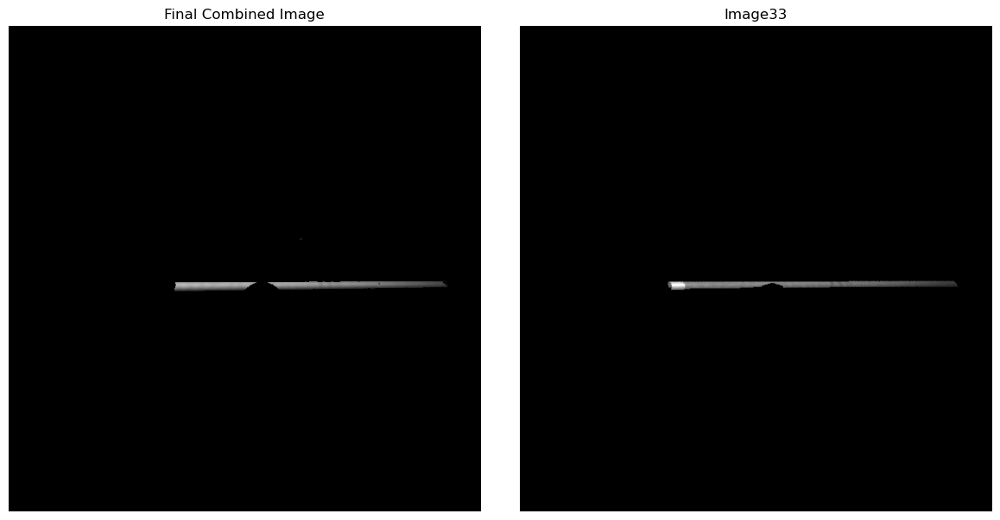

In [225]:
# Combining the final value channel with the original grayscale image
combined_img = cv2.merge([final_value, final_value, final_value])

# Plotting the results
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plotting final combined image
axes[0].imshow(cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB))
axes[0].set_title('Final Combined Image')
axes[0].axis('off')

# Plotting image33.png
img3 = cv2.imread("image33.png")
axes[1].imshow(cv2.cvtColor(img3, cv2.COLOR_BGR2RGB))
axes[1].set_title('Image33')
axes[1].axis('off')

plt.tight_layout()
plt.show()